# Where in Essex should new play areas ideally be implemented?

* **Authors:** Madeline Sully

* **Student ID:** 220015259

* **Date:** 11/12/12

**Abstract:**

This report uses geo-spatial data analysis tools QGIS and Python to discern the most ideal locations to implement formal or informal play areas in Essex. It concludes that the most ideal places to consider play-area implementation are in the Councils of Uttlesford and Maldon, specifically in the wards of Littlebury, Chesterford & Wenden Lofts, The Sampfords, and  Tilingham, respectively, and highlights the specific urban, suburban and grassland areas where playareas could viably be implemented in these wards. This research could be used to enhance policy regarding Child Activity and Obesity, and could especially benefit children of Low-Income families in Uttlesford and Maldon.

**Keywords:** Essex, play, playground,play area, health, class, GIS,MCE, Python, Spatial Data, policy

# GitHub Repository
- **GitHub Link:** [Add here the link to your repo]

## Declaration

> In submitting this assignment, I hereby confirm that I have read the University's statement on Good Academic Practice. The following work is my own. Significant academic debts and borrowings have been properly acknowledged and referenced.


**Table of Contents:**

* Introduction
* Methodology
* Results
* Discussion
* Conclusion
* Appendix
* Citations


## Introduction

In the UK, over half of children are consistently failing to meet recommended levels of daily physical activity (UKActiveKids, 2018). This makes today's generation the most sedentary in history. This is a significant issue because low levels of physical activity 'increase all causes of mortality, double the risk of cardiovascular diseases, diabetes, and obesity, and increase the risks of colon cancer, high blood pressure, osteoporosis, lipid disorders, depression and anxiety' (World Health Organization, 2002), i.e, significantly degrade physical and mental health.

There is evidence to suggest that play areas promote higher levels of physical activity amongst children (Schipperijn et al., 2024), and are 'essential to meeting the needs of children to play outdoors' (ScotGov, 2023) . Play areas are especially important in minority and low-income communities (Cohen et al., 2007), but research highlights that they are an under-used and under-valued mechanism:  31% of children under the age of nine live more than a ten-minute walk from the nearest playground (WCL, 2024). To combat this issue, this project will conduct an MCE to determine the best areas to implement new play areas for children. This could be either a formal play areas like a play ground, or an established area of land where informal play can take place (ScotGov, 2023)

I have chosen to use Essex as my spatial extent for analysis for a few reasons. Firstly, because I am from Essex myself, so this project is of personal interest. Secondly, because Essex experiences unequal distributions of income and health - for example across the region,  people in more affluent areas live on average 19 years longer than those in poorer areas(University of Essex, 2023), and experience 53% higher levels of adult obesity. Despite being an affluent county on the whole, Essex is also home to Jaywick, the poorest ward in the whole of England, and deprivation inequality within authorities can vary widely. Additionally, Essex is a very rural county with 72% of land designated as rural (Essex Rural Partnership, 2020). This rurality can signifcantly limit access to facilities, and as such children's access to play oppurtunities. Given the evident issues with health and income inequality, and the value of play-parks for childrens health in lower-income areas, I feel my work could highlight the areas most ideal for play, benefit Essex policy and increase oppurtunities for Essex's youth.


## Data
To collect my data, I scoured many open data sources, with https://www.data.gov.uk/ being a great vehicle to find data that is reliable and generally up-to-date.

I chose my data sources because I wanted to consider play-area implementation from three angles. Firstly, the suitability of the land itself to be home to a play area. Secondly, common high risks to children, I.E cars and bodies of water. Thirdly, I wanted to consider the sustainabaility of my research. It is important to maintain the UK's biodiversity, so I wanted to ensure I was aware of any conservation areas that should be protected from land change. This is also important because there is likely overlap between some green areas that are suitable for play areas and environmentally important zones.



## Datasets and sources:

In [ ]:
data = [["Boundary - Vector file containing Authority Boundaries of Essex County", "Essex Open Data"],
        ["Landuse - Landuse map of England in raster format Resolution = 10m", "Digimap"],
        ["Roads - Vector files of all Roads in England", "OS Open Roads"],
        ["Parks - Vector file containing Polygons of all registered parks", "Historic England"],
        ["Environmentally Sensitive Aeas (ESAs) - Vector file containing Polygons of ESAs in England ", "Natural England"],
        ["Areas of Scientific Interest - Vector file contaning Polygons of areas of scientific interest ", "DEFRA"]]

col_names = ["Dataset", "Source"]
print(tabulate(data, headers=col_names, tablefmt="fancy_grid"))

╒═══════════════════════════════════════════════════════════════════════════════════════════════╤══════════════════╕
│ Dataset                                                                                       │ Source           │
╞═══════════════════════════════════════════════════════════════════════════════════════════════╪══════════════════╡
│ Boundary - Vector file containing Authority Boundaries of Essex County                        │ Essex Open Data  │
├───────────────────────────────────────────────────────────────────────────────────────────────┼──────────────────┤
│ Landuse - Landuse map of England in raster format Resolution = 10m                            │ Digimap          │
├───────────────────────────────────────────────────────────────────────────────────────────────┼──────────────────┤
│ Roads - Vector files of all Roads in England                                                  │ OS Open Roads    │
├───────────────────────────────────────────────────────────────

# Methodology

## Tools:

To perform my spatial data analysis, I will be using QGIS and Python. I will use QGIS to perform my Multi-Criteria Evaluation, then Python scripting for data visualisation, and to determine the authorities and posible best locations to designate play areas.

##QGIS Element

To discern where would be best to construct new playgrounds for children, I will be performing a Multi-Criteria Evaluation. This method is useful because it allows me to control for multiple variables at once, whilst extracting valuable spatial data that can inform my report. This method means I can highlight suitable zones for play areas without putting children at adverse risk.

This method will involve creating a suitability map for children's playgrounds using some key criteria and constraints.

*Criteria:*

**1. Be as close to urban/suburban areas as possible**

**2. Be as far from A roads as possible**

I am weighting these as **60%** and **40%** respectively, because it is important for a play area to be near as many people as possible (i.e densely populated areas), so it can help as many children as possible. Child safety is paramount, and main roads are high risk areas, so are weighted as such.

*Constraints:*

**3. Land use constraint: Play area cannot be on agricultural land, on freshwater, on saltmarsh**

**4. Play area cannot be in Environmentally Sensitive Areas**

**5. Play area cannot be built in Areas of Scientific Interest**

**6. Play area must be 20+ metres from freshwater bodies**

Using these criteria and constraints, I will create a suitability index for play areas, highlighting areas that are over 80% suitable for play area designation.

# QGIS Data Processing

In QGIS, I processed my files so that they were specific to Essex. In brief, this involved:
1. Dissolving 'Extent' and removing shape fill to extract only the county boundary
2. Altering 'Landuse' symbolology to a unique render and creating 20 values with colurs that correlate to those used in Digimap, to clearly see each Landuse type
3. Clip all road vectors using Vector overlay to the extent of 'Boundary', then extracting by 'function' attribute to obtain only A Roads
4. Clipping PARK, ESA and ASI vectors to the extent of 'Boundary'

The output of my pre-processed data can be seen in the study map below.

## Study Area Map:

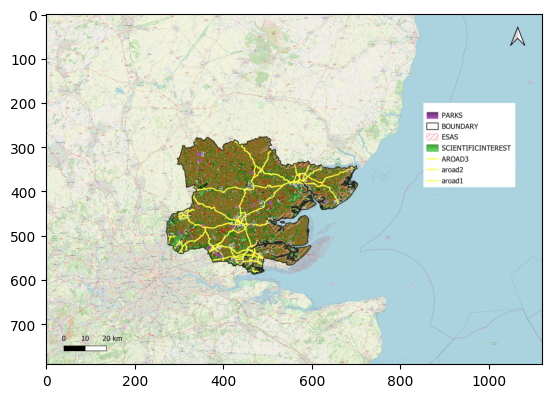

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('/content/drive/MyDrive/essex.png')
imgplot = plt.imshow(img)
plt.show()


###Note:
the National Projected Coordinate System used throughout this project is: OSGB36 / British National Grid - United Kingdom Ordnance Survey - EPSG 27700, unless necessarily converted to EPSG 4326 for lonboard.

*Suitability Index Formula:*

**S=(0.6 * C1Urb + 0.3 * C2roads + 0.1c4park) * constraint1 * constraint2 * constraint3 * constraint4**


To prepare for my suitability calculation, I created distance rasters for my criteria. To be as far from roads as possible, i normalised the maximum distance to 1. To be as close to urban/suburban areas as possible, the minimum distance was normalised to one.

I created a boolean raster for landuse, in which the parcels that were arable/freshwater/ saltmarsh were equal to Zero. This appears as the dark purple areas on my map. I also made booleans for my ESAs and ASIs. Finally, I created a 20m buffer around my freshwater polygons.

## Python Element

My MCE will provide a basis for understanding the best places to implement formal or informal play areas, but it will lack county-specific information.
Python is very useful because I can perfrom high-quality spatial analysis tests that fucnction at a ward-level of specificity.

 Using a variety of GeoPandas, MatPlotLib and Lonboard tools, I will create a series of maps that hone in on the specific districts which are most suitable for future play areas, and identify where in these districts would be best.
  
 I will focus on implementing play areas far away from pre-existing parks, to enhance the equality of facility accessibility in the chosen districts. This will involve K-MEANS testing to analyse the spatial distribution of my most suitable areas based on polygon centroid similarity, spatial joins to analyse connections between dataframes, bar charts for visualisation, and distance calculations to determine my final results.

## Results


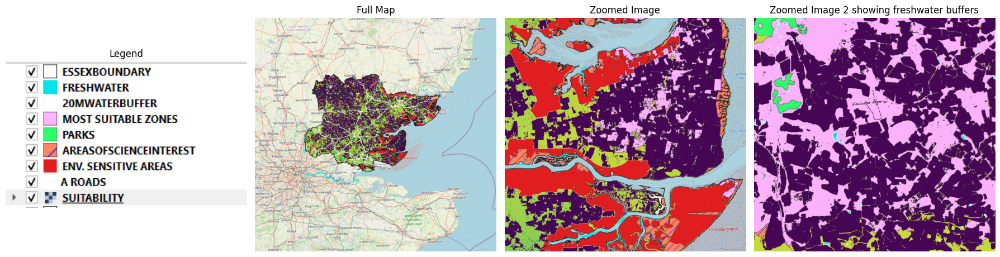

In [ ]:
fig, axes = plt.subplots(1,4, figsize=(18,5))

axes[0].imshow(legend)
axes[0].axis('off')
axes[0].set_title('Legend')

axes[1].imshow(im)
axes[1].axis('off')
axes[1].set_title('Full Map')

axes[2].imshow(im1)
axes[2].axis('off')
axes[2].set_title('Zoomed Image')

axes[3].imshow(im2)
axes[3].axis('off')
axes[3].set_title('Zoomed Image 2 showing freshwater buffers')

plt.tight_layout()
plt.show()


This is my final QGIS map, following my Multi-Criteria-Evaluation. There are clear clusters of Most Suitable Zones, as illustrated by the bright pink polygons. This broadly answers the question 'Where is most suitable in Essex to implement Play Areas', but it could be more specific.

##Spatial Data Analysis
Using the extracted information from my MCE, I created a lonboard map which more clearly shows the most suitable zones (pink) for playground construction. You can zoom in to see freshwater (blue) and the buffer (orange).

On this map I've added all the suburban and urban areas in Essex, as well as local authority boundaries, parks, ESAs and ASIs, to better demonstrate the distribution of my most suitable areas.

In [310]:
m = Map(layers=[urbsuburblayer, layer, boundary_layer,parkslayer,waterbufferlayer, freshwaterlayer, esaslayer, asislayer]) #see appendix for layer code

In [311]:
m


Map(custom_attribution='', layers=(SolidPolygonLayer(get_fill_color=[128, 128, 128, 128], table=arro3.core.Tab…

## K-Means Clustering
  Given the specificity of my QGIS results, I chose a small n value of clusters. Using spatial join between centre-clusters and boundaries, I was able to determine which Authorities are most ideal for play area consideration.

In [292]:
suitableareas1['centroid']=suitableareas1['geometry'].centroid

In [293]:
centroids = suitableareas1['centroid'].apply(lambda point: [point.x, point.y]).to_list()

In [294]:
suitableareas1['latitude']= suitableareas1['centroid'].apply(lambda point: point.y)
suitableareas1['longitude']= suitableareas1['centroid'].apply(lambda point: point.x)

In [295]:
kmean = KMeans(n_clusters=3, random_state=42)
suitableareas1['kmeans_cluster'] = kmean.fit_predict(suitableareas1[['longitude', 'latitude']])
cluster_centers= kmean.cluster_centers_

In [319]:
from shapely import wkt
suitableareas1['centroid'] = suitableareas1['centroid'].apply(lambda geom: wkt.loads(geom)if isinstance(geom, str) else geom)
suitableareas1['centroid'] = suitableareas1['centroid'].apply(lambda geom: geom.wkt)
layer_cl7 = SolidPolygonLayer.from_geopandas(
    suitableareas1,
    get_fill_color = color_array_kmeans
)
cluster_centers_gdf = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(cluster_centers[:, 0], cluster_centers[:, 1]),
    crs=suitableareas1.crs
)
cluster_centers_layer = ScatterplotLayer.from_geopandas(
    cluster_centers_gdf,
    get_fill_color = color_array_clusters,
    radius_scale=1000,
    opacity=0.8
)
boundarycluster_layer = PolygonLayer.from_geopandas(
    boundary,
    get_fill_color=[255, 255, 255, 0],
    get_line_color=[0, 0, 0, 255],
    get_line_width=80
)

map_cl7 = Map(layers=[layer_cl7, boundarycluster_layer, cluster_centers_layer])
map_cl7

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


Map(custom_attribution='', layers=(SolidPolygonLayer(get_fill_color=arro3.core.ChunkedArray<FixedSizeList(Fiel…

## Determining Location Specifics

In [305]:
print(gdfpoints) #see lines

                   geometry          point_id
0  POINT (0.37682 52.00518)  Uttlesford 004C 
1  POINT (0.17911 52.01713)   Uttlesford 003B
2  POINT (0.89963 51.69855)       Maldon 006E


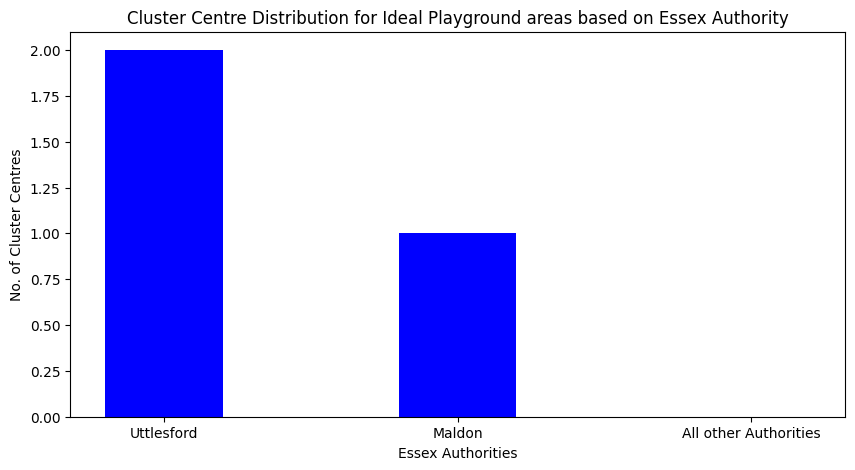

In [ ]:
data1 = {'Uttlesford': 2, 'Maldon': 1, 'All other Authorities':0 }

courses = list(data1.keys())
values = list(data1.values())

fig = plt.figure(figsize = (10, 5))

# creating the bar plot
plt.bar(courses, values, color ='blue',
        width = 0.4)

plt.xlabel("Essex Authorities")
plt.ylabel("No. of Cluster Centres")
plt.title("Cluster Centre Distribution for Ideal Playground areas based on Essex Authority")
plt.show()



Here I am demonstrating that the Authorities of Focus for play area implementation are Uttlesford and Maldon. I then discerned which specific district of these authorities my cluster entres were in.

In [ ]:
authority_name = boundary.loc[joined_data.iloc[0]['index_right'], 'LSOA21NM']
print(f"Cluster center 0 is in: {authority_name}")
authority_name = boundary.loc[joined_data.iloc[1]['index_right'], 'LSOA21NM']
print(f"Cluster center 1 is in: {authority_name}")
authority_name = boundary.loc[joined_data.iloc[2]['index_right'], 'LSOA21NM']
print(f"Cluster center 2 is in: {authority_name}")


Cluster center 0 is in: Uttlesford 004C
Cluster center 1 is in: Maldon 006E
Cluster center 2 is in: Uttlesford 003B


## Finding the areas in Uttlesford and Maldon that would most benefit from play areas

In [ ]:
parks['centroid']=parks['geometry'].centroid
centroidsparks = parks['centroid'].apply(lambda point: [point.x, point.y]).to_list()
parks['latitude']= parks['centroid'].apply(lambda point: point.y)
parks['longitude']= parks['centroid'].apply(lambda point: point.x)
kmean1 = KMeans(n_clusters=5, random_state=42) #first kmeans test using default parameters
parks['kmeans_cluster'] = kmean1.fit_predict(parks[['longitude', 'latitude']])
cluster_centers= kmean1.cluster_centers_

In [ ]:
park_centroids_gdf = gpd.GeoDataFrame(
    parks[['Name']],
    geometry=gpd.points_from_xy(parks['longitude'], parks['latitude']),
    crs=parks.crs
)
print(park_centroids_gdf)

In [ ]:
parkjoin = sjoin(park_centroids_gdf, boundary, how='left', predicate='within')

I extracted the parks polygons located within any of the districts in Uttlesford or Maldon:

In [ ]:
if parkjoin['LSOA21NM'].str.contains('Uttlesford').any():
   print(parkjoin[parkjoin['LSOA21NM'].str.contains('Uttlesford')]['LSOA21NM'])
if parkjoin['LSOA21NM'].str.contains('Maldon').any():
  print(parkjoin[parkjoin['LSOA21NM'].str.contains('Maldon')]['LSOA21NM'])

6     Uttlesford 002C
11    Uttlesford 001B
24    Uttlesford 009C
25    Uttlesford 002D
26    Uttlesford 003C
28    Uttlesford 003C
33    Uttlesford 006D
Name: LSOA21NM, dtype: object
20    Maldon 002A
Name: LSOA21NM, dtype: object


Then I ran code to determine the furthest possible point in my districts from a park in their authority.

In [ ]:
furthest_pointu = uttlesford_004c.loc[uttlesford_004c['distance_to_park'].idxmax()]

In [ ]:
longitudefurthestuttle = furthest_pointu.geometry.centroid.x
latitudefurthestuttle = furthest_pointu.geometry.centroid.y
print(longitudefurthestuttle)
print(latitudefurthestuttle)

In [ ]:
uttlesford_003b = boundary[boundary['LSOA21NM']== 'Uttlesford 003B']

In [ ]:
def distance_to_nearest_park(point):
  nearest = nearest_points(point, parkssgl)[1]
  return point.distance(nearest)
uttlesford_003b['distance_to_park'] = uttlesford_003b.geometry.apply(distance_to_nearest_park)


In [ ]:
furthest_pointu1 = uttlesford_003b.loc[uttlesford_003b['distance_to_park'].idxmax()]

In [ ]:
longitudefurthestuttle1 = furthest_pointu1.geometry.centroid.x
latitudefurthestuttle1 = furthest_pointu1.geometry.centroid.y
print(longitudefurthestuttle1)
print(latitudefurthestuttle1)

In [ ]:
maldon006e = boundary[boundary['LSOA21NM']== 'Maldon 006E']

In [ ]:
def distance_to_nearest_park(point):
  nearest = nearest_points(point, parkssgl)[1]
  return point.distance(nearest)
maldon006e['distance_to_park'] = maldon006e.geometry.apply(distance_to_nearest_park)

In [ ]:
furthest_pointm = maldon006e.loc[maldon006e['distance_to_park'].idxmax()]

In [ ]:
longitudefurthestmaldon = furthest_pointm.geometry.centroid.x
latitudefurthestmaldon = furthest_pointm.geometry.centroid.y
print(longitudefurthestmaldon)
print(latitudefurthestmaldon)

Then I tabulated the data:

In [ ]:
datafurthest = [["Uttlesford 004C", "563241.4219787604,236749.51452525644"],
        ["Uttlesford 003B", "549632.4430344539,237652.77889366684"],
        ["Maldon 006E", "600478.5928935289,203957.60141544123"]]

col_names1 = ["Authority", "Furthest Point from a Park"]
print(tabulate(datafurthest, headers=col_names1, tablefmt="fancy_grid"))

╒═════════════════╤══════════════════════════════════════╕
│ Authority       │ Furthest Point from a Park           │
╞═════════════════╪══════════════════════════════════════╡
│ Uttlesford 004C │ 563241.4219787604,236749.51452525644 │
├─────────────────┼──────────────────────────────────────┤
│ Uttlesford 003B │ 549632.4430344539,237652.77889366684 │
├─────────────────┼──────────────────────────────────────┤
│ Maldon 006E     │ 600478.5928935289,203957.60141544123 │
╘═════════════════╧══════════════════════════════════════╛


I created a dataframe for the suitable zones in my highlighted districts, so that I could visualise them more clearly.

In [ ]:
datapoints = [[563241.4219787604,236749.51452525644 ], [549632.4430344539,237652.77889366684], [600478.5928935289,203957.60141544123]]
geometry = [Point(x, y) for x, y in datapoints]
gdfpoints = gpd.GeoDataFrame(geometry=geometry, crs=target_crs)
gdfpoints['point_id'] = ['Uttlesford 004C ', 'Uttlesford 003B', 'Maldon 006E']

In [ ]:
u003bzones = sjoin(suitableareas1, uttlesford_003b, how='inner', predicate='within')
u004czones = sjoin(suitableareas1, uttlesford_004c, how='inner', predicate='within')
m006ezones = sjoin(suitableareas1, maldon006e, how='inner', predicate='within')
u003bzonesdf = gpd.GeoDataFrame(u003bzones)
u004czonesdf = gpd.GeoDataFrame(u004czones)
m006ezonesdf = gpd.GeoDataFrame(m006ezones)
concat = pd.concat([u003bzonesdf, u004czonesdf, m006ezonesdf])

In [ ]:
best_zones_in_authorities = sjoin(best_zones_data, concat, how='inner', predicate='within')
best_zones_indices_in_authorities = best_zones_in_authorities.index.
filtered_best_zones_data = best_zones_data[best_zones_data.index.isin(best_zones_indices_in_authorities)]

In [ ]:
source_crs = 'epsg:27700'
target_crs = 'epsg:4326'
transformer = pyproj.Transformer.from_crs(source_crs, target_crs, always_xy=True)
transformed_datapoints = [transformer.transform(x, y) for x, y in datapoints]
geometry = [Point(x, y) for x, y in transformed_datapoints]
gdfpoints = gpd.GeoDataFrame(geometry=geometry, crs=target_crs)
gdfpoints['point_id'] = ['Uttlesford 004C ', 'Uttlesford 003B', 'Maldon 006E']

## Final Map

In [297]:
from shapely import wkt
suitableareas1['centroid'] = suitableareas1['centroid'].apply(lambda geom: wkt.loads(geom)if isinstance(geom, str) else geom)
suitableareas1['centroid'] = suitableareas1['centroid'].apply(lambda geom: geom.wkt)

layer_cl7 = SolidPolygonLayer.from_geopandas(
    suitableareas1,
    get_fill_color=[255, 102,203]
)
boundarycluster_layer = PolygonLayer.from_geopandas(
    boundary,
    get_fill_color=[255, 255, 255, 0],
    get_line_color=[0, 0, 0, 255],
    get_line_width=80
)
gdfpoints = gdfpoints.to_crs('epsg:4326')
furthest_points_layer = ScatterplotLayer.from_geopandas(
    gdfpoints,
    get_fill_color=[255, 0, 102],
    radius_scale=200,
    opacity=1
)
authoritylayer = SolidPolygonLayer.from_geopandas(
    maldon006e,
    get_fill_color =[200, 162, 200, 128]
)
authoritylayer1 = SolidPolygonLayer.from_geopandas(
    uttlesford_003b,
    get_fill_color =[200, 162, 200, 128]
)
authoritylayer2 = SolidPolygonLayer.from_geopandas(
    uttlesford_004c,
    get_fill_color =[200, 162, 200, 128]
)

bestzoneslayer = SolidPolygonLayer.from_geopandas(
    filtered_best_zones_data,
    get_fill_color=[255, 204, 0]
)
map_final = Map(layers=[authoritylayer, authoritylayer1, authoritylayer2, urbsuburblayer, layer_cl7, bestzoneslayer, parkslayer, esaslayer,furthest_points_layer, waterbufferlayer,freshwaterlayer,asislayer, boundarycluster_layer ])
map_final

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonb

Map(custom_attribution='', layers=(SolidPolygonLayer(get_fill_color=[200, 162, 200, 128], table=arro3.core.Tab…

## Discussion
 **MCE:**
 My MCE shows that there are clear clusters of Most Suitable Zones, as illustrated by the bright pink polygons. This broadly answers the question 'Where is most suitable in Essex to implement Play Areas' in relation to spatial constraints like A Roads and my weighted criteria, but it could be more specific.

 **First Lonboard Map and KMEANS MAP:**
The first lonboard map shows that there is clearly some clustering of suitable areas in the North West and the East of Essex. However, there was a need to build on this initial map to gain better specificity. By performing a KMEANS test, I was able to cluster my suitable zones and determine the Local Authorities which the the cluster centres fall into, which in this case was Uttlesford and Maldon.

**Final Map:**
This final map highlights the districts (lilac) that would be ideal for play area implementation given my analysis. This map also has scatter points that highlight the farthest area in these districts from parks in the authorities.
The yellow polygons are the areas determined as 'Most Suitable' using my QGIS MCE, which are wholly contained in my identified districts. Theoretically, these polygons are those that should be prioritised for possible play-area implementation, as they are the suitable zones which are simultanaeously farthest from parks.

From my final map, I not only discerned which districts of Uttlesford and Maldon should be prioritised for play-area construction, but highlighted the most suitable zones within these districts. An advantage of my research was thus the ability to gain Ward-Level specicifity, which would possibly make for more efficient policy uptake as a bottom-up appraoch can be utilised.  
Play areas should be implemented in the wards of:
###Uttlesford
* Littlebury, Chesterford & Wenden Lofts
* The Sampfords

###Maldon
* Tilingham


Both Uttlesford and Maldon highlight in their Wellbeing briefs that their authorities suffer from a lack of access to facilities due to the rural nature of their area (Maldon Council, 2023), (Uttlesford Council, 2023). Both Maldon and Uttlesford are below the national mean deprivation score, but there is still income inequality; for example in Uttlesford 18% of children are in low-income families.  

In fact, being of a low-income in a comparatively affluent area could have worse health outcomes than if the individual were to live in a deprived area (Stafford and Marmot, 2003). As such, it is important to cater to the vulnerable individuals in these districts. Additionally, both areas report rising levels of obesity (ibid, 2023). Promoting physical activity via outdoor play is a vehicle to reduce obesity in these districts, so my results could be valuable for policy regarding infrastructural moves to improve health outcomes of residents in Maldon and Uttlesford.

 With all of the criteria and constraints considered in my Multi-Criteria Evaluation, I would argue that I have suggested areas that are both accessible (i.e in proximity to suburban/urban areas) and promote better equality in terms of oppurtunity for play (i.e are in areas that lacked previous green spaces/parks).

 ## Limitations

I used data from a variety of different sources and covered a few different criteria and constraints, however there were certainly aspects of play-area implementation that I did not consider, for example proximity to schools.Calcualating my highlighted zones in terms of walking and driving distance to schools would be a useful future consideration as placing play-areas near schools would enhance accessibility even further. Additionally, I constrained my data so that play-areas were not built on land with unsuitable terrain/landuse, but this does not necessarily mean that my 'Suitable Zones' are 100% usable for play-areas. For example I cannot discern buildings from open suburban areas within the raster. It is likely that the actual usable areas are much smaller and specific.

Another limit of my report is a lack of supporting Qualitative data to assess local opinions on the current state of play-areas and the possibility of future implementation. By relying solely on spatial data, there is a risk that my assessment is too '2D' or simple, and doesn't take into account the real-life nuance of urban planning and its implications for communities on the ground. To enhance this project, further research could incorporate pre-emptive surveying and interviewing to gain an understanding of community opinion on play-areas in their areas.

The weighting of my criteria for my MCE were subjective and chosen by myself. This potentially risks bias, and also may not be an accurate weighting of the criteria. To improve the validity of my multi-criteria evaluation, future endeavours should either collate data based off of pre-existing legal and political policy on play-areas, or conduct a peer-review of MCE weightings to come to a collaborative conclusion.

#Reflection
This research was incredibly interesting to me as a resident of Essex. I learnt a lot about my home county, and found out that there is a lot of Environmentally Sensitive and Scientifically Interesting land in Essex, which I found particularly novel, as I did not previously associate my home with a lot of natural beauty.I found this report intellectually challenging but also extremely rewarding, and I feel I have really enhanced my QGIS and Python skills and confidence.

## Conclusion
 My research question was 'Where in Essex should New Play Areas ideally be implemented?'. My research concludes that the ideal places to implement new play areas would be Uttlesford (Littlebury, Chesterford & Wenden Lofts and The Sampfords) and Maldon (Tilingham). There are limitations to my research, but my results are a base for which further research could be conducted, and a reasonable starting point for political conversations about child access to outdoor play and physical activity at Ward-Level in Uttlesford and Maldon.


## Appendix

Include any additional information and code not included in the main body of the paper but may be necessary. This could include:

* Raw data tables
* Additional figures or tables
* Supporting code


In [260]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tabulate import tabulate
from shapely.geometry import Point
import geopandas as gpd

from google.colab import drive
drive.mount('/content/drive', force_remount=True)


# Placeholder code for data loading and preprocessing - If the code is too large, make use of appendix
# section, describing clearly where the code is located to reproduce any map, figure, final results
# and workflow you need to include
# ...


Mounted at /content/drive


In [ ]:
pip install lonboard

In [262]:
pip install tabulate

In [263]:
import numpy as np
import pandas as pd
import geopandas as gpd
from sklearn.cluster import KMeans, DBSCAN
import matplotlib.pyplot as plt
import shapely
import folium
from folium import plugins
import seaborn as sns
from lonboard import Map, ScatterplotLayer, SolidPolygonLayer
from lonboard import viz

In [264]:
from shapely.geometry import Point
from geopandas.tools import sjoin
!pip install pyproj
import pyproj

In [265]:
!pip install pillow

In [266]:
from PIL import Image

In [267]:
im = Image.open("/content/drive/MyDrive/essexmap.tif")
im.show()

In [268]:
im1 = Image.open("/content/drive/MyDrive/zoom1.tif")
im1.show()

In [269]:
im2 = Image.open("/content/drive/MyDrive/zoom2.tif")
im2.show()

In [270]:
legend = Image.open("/content/drive/MyDrive/legend.png")
legend.show()

In [271]:
suitableareas = gpd.read_file('/content/drive/MyDrive/suitableareas.shp')

In [272]:
suitableareas.head(3)

,fid,DN,geometry
0,1.0,1,"POLYGON ((583790 246520, 583830 246520, 583830..."
1,2.0,1,"POLYGON ((582740 246430, 582760 246430, 582760..."
2,3.0,1,"POLYGON ((582830 246450, 582860 246450, 582860..."


In [273]:
urbsuburbs = gpd.read_file('/content/drive/MyDrive/urbsuburbs.shp')

In [320]:
urbsuburbs.head(3)

,fid,DN,geometry
0,579736.0,20,"MULTIPOLYGON (((556469.917 192120, 556469.5 19..."
1,1172360.0,20,"MULTIPOLYGON (((556469.917 192120, 556469.5 19..."
2,444160.0,20,"POLYGON ((546600 193090, 546620 193090, 546620..."


In [274]:
freshwater = gpd.read_file('/content/drive/MyDrive/essexwater.shp')

In [321]:
freshwater.head(3)

,fid,DN,geometry
0,419420.0,14,"POLYGON ((537630 196029.566, 537630 196030, 53..."
1,1012044.0,14,"POLYGON ((537630 196029.566, 537630 196030, 53..."
2,416181.0,14,"POLYGON ((537631.871 196114.575, 537632.057 19..."


In [275]:
boundary=gpd.read_file('/content/drive/MyDrive/Essex County 2021 LSOA boundaries.shp')

In [322]:
boundary.head(3)

,OBJECTID,LSOA21CD,LSOA21NM,GlobalID,Shape__Are,Shape__Len,geometry
0,20167,E01021237,Basildon 001A,bea499f3-4d71-49c8-b759-673c3a7a76f2,929624.020103,6077.175428,"POLYGON ((569036.885 196764.463, 569050.985 19..."
1,20168,E01021238,Basildon 001B,b3def463-4c0a-4244-9ae8-e41ce9220ad0,411131.420616,3731.307935,"POLYGON ((568732.598 197157.285, 568741.809 19..."
2,20169,E01021239,Basildon 003A,47f1d79d-b3c2-4af8-89bd-f2c7577fd4f6,579785.422150,4770.448207,"POLYGON ((568240.797 196095.593, 568254.081 19..."


In [276]:
waterbuffer = gpd.read_file('/content/drive/MyDrive/essexwaterbuffer.shp')

In [277]:
parks = gpd.read_file('/content/drive/MyDrive/PARKS.shp')
esas = gpd.read_file('/content/drive/MyDrive/ESAS.shp')
asis = gpd.read_file('/content/drive/MyDrive/ASIS.shp')

In [278]:
easdf = gpd.GeoDataFrame(gpd.read_file('/content/drive/MyDrive/ESAS.shp'))

In [279]:

esa_intersects = suitableareas[suitableareas.intersects(esas.union_all())]


In [280]:
intersect_indices = esa_intersects.index

In [281]:
suitableareas1 = suitableareas.drop(intersect_indices)

In [282]:
asisdf = gpd.GeoDataFrame(gpd.read_file('/content/drive/MyDrive/ASIS.shp'))

In [283]:
layer = SolidPolygonLayer.from_geopandas(
    suitableareas,
    get_fill_color=[255,192,203],)
m= Map(layers=[layer])

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


In [284]:
freshwaterlayer = SolidPolygonLayer.from_geopandas(
    freshwater,
    get_fill_color=[135,206,250, 255],)

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


In [285]:
waterbufferlayer =  SolidPolygonLayer.from_geopandas(
    waterbuffer,
    get_fill_color=[255,165,0, 255],)

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


In [286]:
urbsuburblayer = SolidPolygonLayer.from_geopandas(
    urbsuburbs,
    get_fill_color=[128,128,128, 128],)

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


In [287]:
parkslayer = SolidPolygonLayer.from_geopandas(
    parks,
    get_fill_color=[0, 128, 0, 255],)
esaslayer = SolidPolygonLayer.from_geopandas(
    esas,
    get_fill_color=[65, 105, 225, 255],)
asislayer = SolidPolygonLayer.from_geopandas(
    asis,
    get_fill_color=[128, 0, 128, 255],)

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


In [288]:
from lonboard import PolygonLayer

In [289]:

boundary_layer = PolygonLayer.from_geopandas(
    boundary,
    get_fill_color=[255, 255, 255, 0],
    get_line_color=[0, 0, 0, 255],
    get_line_width=80
)

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


In [313]:
categories_kmeans = suitableareas1['kmeans_cluster'].unique()
colors_kmeans = sns.color_palette("viridis", len(categories_kmeans))
color_dict_kmeans = dict(zip(categories_kmeans, colors_kmeans))
color_array_kmeans = np.array([tuple(np.append(np.multiply(color_dict_kmeans.get(x, (0, 0, 0)), 255).astype(int), 255)) for x in suitableareas1['kmeans_cluster']], dtype=np.uint8)
layer_cl7.radius_scale = 50
layer_cl7.opacity = 1
layer_cl7.get_fill_color = color_array_kmeans

categories_clusters = suitableareas1['kmeans_cluster'].unique()
colors_clusters = sns.color_palette("tab10", len(categories_clusters))
color_dict_clusters = dict(zip(categories_clusters, colors_clusters))
color_array_clusters = np.array([tuple(np.append(np.multiply(color_dict_clusters.get(x, (0, 0, 0)), 255).astype(int), 255)) for x in range(len(cluster_centers))], dtype=np.uint8)
cluster_centers_layer.radius_scale = 500
cluster_centers_layer.opacity = 1
cluster_centers_layer.get_fill_color = color_array_clusters

In [299]:
import pandas as pd
df = pd.DataFrame(cluster_centers, columns=['Longitude', 'Latitude'])
print(df)

       Longitude       Latitude
0  562074.869468  234778.978757
1  599932.596166  205604.453697
2  548848.431819  234071.702294


In [ ]:
print(parks['centroid'])
print(parks['Name'])

In [301]:
uttlesford_004c = boundary[boundary['LSOA21NM']== 'Uttlesford 004C']

In [302]:
crs = park_centroids_gdf.crs
print(crs)

EPSG:27700


In [303]:
parkssgl = parks.unary_union

<ipython-input-303-031455a7efd7>:1: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  parkssgl = parks.unary_union


In [304]:
print(parkjoin.loc[6,'Name'])
print(parkjoin.loc[11,'Name'])
print(parkjoin.loc[24,'Name'])
print(parkjoin.loc[25,'Name'])
print(parkjoin.loc[26,'Name'])
print(parkjoin.loc[28,'Name'])
print(parkjoin.loc[33,'Name'])
print(parkjoin.loc[20,'Name'])

BRIDGE END GARDENS
AUDLEY END
DOWN HALL
THE MAZE, SAFFRON WALDEN
QUENDON HALL
SHORTGROVE HALL
EASTON LODGE
BRAXTED PARK


In [306]:
!pip install shapely
from shapely.ops import nearest_points
from shapely.geometry import Point
def distance_to_nearest_park(point):
  nearest = nearest_points(point, parkssgl)[1]
  return point.distance(nearest)
uttlesford_004c['distance_to_park'] = uttlesford_004c.geometry.apply(distance_to_nearest_park)


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [307]:
import pandas as pd
import geopandas as gpd
cluster_centers_gdf = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(cluster_centers[:, 0], cluster_centers[:, 1]),
    crs=boundary.crs
)

In [308]:
from geopandas.tools import sjoin
joined_data = sjoin(cluster_centers_gdf, boundary, how='left', predicate='within')

In [309]:
source_crs = 'epsg:27700'
target_crs = 'epsg:4326'
transformer = pyproj.Transformer.from_crs(source_crs, target_crs, always_xy=True)
transformed_datapoints = [transformer.transform(x, y) for x, y in datapoints]
concat = concat.rename(columns={'index_right': 'index_right_concat'})
best_zones_data = suitableareas1[suitableareas1.index.isin(best_zones_indices)].copy()

#References

*Reference list*

Cohen, D.A., McKenzie, T.L., Sehgal, A., Williamson, S., Golinelli, D. and Lurie, N. (2007). **Contribution of Public Parks to Physical Activity**. American Journal of Public Health, 97(3), pp.509–514. doi:https://doi.org/10.2105/ajph.2005.072447.

Essex Rural Partnership (2020). **Essex Rural Strategy 2020 consultation** - Essex County Council - Citizen Space. [online] consultations.essex.gov.uk. Available at: https://consultations.essex.gov.uk/rci/essex-rural-strategy-2020-consultation/.Leam,

R. (2022). **Levelling up – the Only Way for Essex** - Bennett Institute for Public Policy. [online] Bennett Institute for Public Policy. Available at: https://www.bennettinstitute.cam.ac.uk/blog/levelling-up-essex/ [Accessed 6 Dec. 2024].

Maldon Council (2023). **Maldon Corporate Plan 2023-2027**. maldon.gov.uk/corporateplan. Maldon District Council.

Schipperijn, J., Cathrine Damsbo Madsen, Mette Toftager, Danielle Nørager Johansen, Lousen, I., Thea Toft Amholt and Charlotte Skau Pawlowski (2024). **The Role of Playgrounds in Promoting Children’s Health – a Scoping Review**. The international journal of behavioural nutrition and physical activity, 21(1). doi:https://doi.org/10.1186/s12966-024-01618-2.

ScotGov (2023). **Preparing the Play Sufficiency Assessment**. [online] www.gov.scot. Available at: https://www.gov.scot/publications/scottish-government-planning-guidance-play-sufficiency-assessment/pages/3/.Stafford, M. and Marmot, M. (2003).

**Neighbourhood Deprivation and health: Does It Affect Us All equally?** International Journal of Epidemiology, [online] 32(3), pp.357–366. doi:https://doi.org/10.1093/ije/dyg084.

UKActiveKids (2018). **Generation Inactive**. [online] Available at: https://www.ukactive.com/wp-content/uploads/2018/09/Generation-Inactive_1_ukactive.pdf.


University of Essex (2023). **£5m for county-wide Partnership to Tackle Health Inequalities** | University of Essex. [online] Essex.ac.uk. Available at: https://www.essex.ac.uk/news/2023/12/06/partnership-to-tackle-health-inequalities [Accessed 6 Dec. 2024].

Uttlesford Council (2023). **Uttlesford Health and Wellbeing Strategy 2023-2028**. [online] Uttlesford District Council. Available at: https://www.uttlesford.gov.uk/article/8253/Uttlesford-Health-and-Wellbeing-Strategy-2023-2028.

WCL (2024). **Green Space Index 2024**. [online] experience.arcgis.com. Available at: https://experience.arcgis.com/experience/405187bb87f041c9a4d70c6b346c5bc4.

**World Health Organization (2002)**. Physical Inactivity a Leading Cause of Disease and disability, Warns WHO. [online] www.who.int. Available at: https://www.who.int/news/item/04-04-2002-physical-inactivity-a-leading-cause-of-disease-and-disability-warns-who.